*Eduardus Tjitrahardja | @edutjie | 2022*

# Data Sprint 82 - Smart-Grid Stability Prediction

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from IPython.display import display

In [2]:
plt.style.use('seaborn')

## Load Dataset

**Data Description**

1. **tau[x]**: reaction time of participant (real from the range [0.5,10]s). Tau1 - the value for electricity producer. 

2. **p[x]**: nominal power consumed(negative)/produced(positive)(real). For consumers from the range [-0.5,-2]s^-2; p1 = abs(p2 + p3 + p4) 

3. **g[x]**: coefficient (gamma) proportional to price elasticity (real from the range [0.05,1]s^-1). g1 - the value for electricity producer. 

4. **stab**: the maximal real part of the characteristic equation root (if positive - the system is linearly unstable)(real)

In [3]:
train_df = pd.read_csv('data/train_dataset.csv')
train_df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
0,5.813047,8.315720,7.902158,5.607994,3.882225,-1.219286,-1.718614,-0.944324,0.098318,0.776069,0.099405,0.297344,0.014721
1,1.004888,9.964462,3.507471,6.466059,3.661015,-0.955675,-1.829410,-0.875929,0.149197,0.730138,0.698466,0.196442,0.001280
2,5.736974,9.505319,5.749539,3.171354,3.103797,-0.611009,-0.633226,-1.859562,0.829826,0.821610,0.931990,0.651432,0.081829
3,4.766037,3.754471,4.486994,5.557779,2.349806,-1.005188,-0.524797,-0.819822,0.923570,0.304512,0.108366,0.453463,0.030169
4,4.114349,1.111495,0.535156,5.945791,4.765681,-0.983886,-1.927222,-1.854574,0.967572,0.510802,0.670605,0.511837,-0.015164


In [4]:
test_df = pd.read_csv('data/test_dataset.csv')
test_df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4
0,9.590301,6.509298,2.773227,5.772789,4.427934,-0.826848,-1.709692,-1.891394,0.246212,0.665179,0.277121,0.551572
1,4.141337,8.400888,1.869624,1.112868,3.671563,-1.513896,-1.458615,-0.699052,0.081811,0.662959,0.169682,0.094963
2,0.513173,8.952464,4.682291,8.118211,2.862390,-0.758014,-0.789249,-1.315127,0.825187,0.316378,0.697997,0.769319
3,7.217495,9.136573,7.874681,9.705713,2.407420,-0.533106,-0.507365,-1.366948,0.744307,0.193373,0.120486,0.201458
4,7.182020,6.333832,4.543132,2.682614,4.545965,-1.153566,-1.398055,-1.994344,0.654686,0.128789,0.564987,0.408424


In [48]:
print(f"Train shape: {train_df.shape}\nTest shape: {test_df.shape}")

Train shape: (48000, 13)
Test shape: (12000, 12)


In [49]:
print("Datasets' info:")
display(train_df.info())
print("-" * 40)
display(test_df.info())

Datasets' info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48000 entries, 0 to 47999
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    48000 non-null  float64
 1   tau2    48000 non-null  float64
 2   tau3    48000 non-null  float64
 3   tau4    48000 non-null  float64
 4   p1      48000 non-null  float64
 5   p2      48000 non-null  float64
 6   p3      48000 non-null  float64
 7   p4      48000 non-null  float64
 8   g1      48000 non-null  float64
 9   g2      48000 non-null  float64
 10  g3      48000 non-null  float64
 11  g4      48000 non-null  float64
 12  stab    48000 non-null  float64
dtypes: float64(13)
memory usage: 4.8 MB


None

----------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12000 entries, 0 to 11999
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    12000 non-null  float64
 1   tau2    12000 non-null  float64
 2   tau3    12000 non-null  float64
 3   tau4    12000 non-null  float64
 4   p1      12000 non-null  float64
 5   p2      12000 non-null  float64
 6   p3      12000 non-null  float64
 7   p4      12000 non-null  float64
 8   g1      12000 non-null  float64
 9   g2      12000 non-null  float64
 10  g3      12000 non-null  float64
 11  g4      12000 non-null  float64
dtypes: float64(12)
memory usage: 1.1 MB


None

In [50]:
print("TRAIN:")
display(train_df.describe())
print("TEST:")
display(test_df.describe())

TRAIN:


,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
count,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000,48000.000000
mean,5.255310,5.247354,5.252971,5.247852,3.752632,-1.249720,-1.250762,-1.252150,0.525702,0.525031,0.524974,0.525734,0.015735
std,2.746113,2.748811,2.740650,2.743445,0.752178,0.433033,0.433254,0.432931,0.274645,0.274165,0.274867,0.273982,0.036908
min,0.500793,0.500141,0.500141,0.500141,1.582590,-1.999945,-1.999945,-1.999945,0.050009,0.050028,0.050028,0.050028,-0.080760
25%,2.878098,2.857989,2.885198,2.870168,3.221474,-1.625048,-1.625919,-1.626948,0.288208,0.288084,0.286384,0.288725,-0.015609
50%,5.257524,5.254401,5.256991,5.246426,3.752340,-1.249854,-1.252431,-1.253464,0.525816,0.524831,0.524948,0.526082,0.017135
75%,7.638358,7.626270,7.618810,7.621588,4.286167,-0.875207,-0.875870,-0.877312,0.764179,0.762745,0.763904,0.763124,0.044858
max,9.999469,9.999837,9.999837,9.999837,5.864418,-0.500025,-0.500025,-0.500025,0.999937,0.999982,0.999982,0.999982,0.109403


TEST:


,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4
count,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000,12000.000000
mean,5.228761,5.260587,5.238118,5.258593,3.739471,-1.251121,-1.246950,-1.241399,0.522191,0.524878,0.525104,0.522067
std,2.727681,2.716879,2.749654,2.738498,0.751872,0.432971,0.432073,0.433271,0.272627,0.274568,0.271748,0.275280
min,0.500793,0.500473,0.500141,0.500788,1.582590,-1.999926,-1.999945,-1.999926,0.050009,0.050377,0.050028,0.050130
25%,2.856483,2.941801,2.836476,2.898095,3.203697,-1.624900,-1.621452,-1.616216,0.284792,0.285420,0.291774,0.282412
50%,5.229929,5.229391,5.218658,5.266667,3.746799,-1.250488,-1.240239,-1.236606,0.521821,0.525831,0.525131,0.521211
75%,7.565841,7.616099,7.649892,7.639181,4.265352,-0.874680,-0.871557,-0.865052,0.757627,0.761656,0.757355,0.759924
max,9.998995,9.998912,9.999450,9.999443,5.864418,-0.500025,-0.500072,-0.500198,0.999846,0.999982,0.999893,0.999944


In [5]:
combined = pd.concat([train_df, test_df])
combined.shape

(60000, 13)

In [52]:
combined.tail()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
11995,1.557028,8.975725,9.898068,7.303489,4.103773,-0.671335,-1.847325,-1.585113,0.890360,0.061631,0.684872,0.488867,NaN
11996,6.760208,1.712138,1.299575,4.450064,3.078139,-0.718298,-0.549039,-1.810801,0.847209,0.977725,0.971280,0.148586,NaN
11997,3.320625,3.626522,7.914022,7.380421,2.690938,-0.879601,-1.077808,-0.733530,0.825592,0.162194,0.816617,0.449195,NaN
11998,3.852239,4.586590,5.308721,2.489326,3.619630,-0.996281,-0.865107,-1.758242,0.951751,0.539738,0.886380,0.602399,NaN
11999,7.651546,8.680418,7.687730,3.620165,2.825039,-0.855652,-1.293702,-0.675685,0.960367,0.656784,0.183966,0.424109,NaN


## Data Cleaning

### Check Empty Data

In [53]:
train_df.isnull().any()

tau1    False
tau2    False
tau3    False
tau4    False
p1      False
p2      False
p3      False
p4      False
g1      False
g2      False
g3      False
g4      False
stab    False
dtype: bool

In [54]:
test_df.isnull().any()

tau1    False
tau2    False
tau3    False
tau4    False
p1      False
p2      False
p3      False
p4      False
g1      False
g2      False
g3      False
g4      False
dtype: bool

**Observations:**
- The datas have no empty value

### Check Outliers

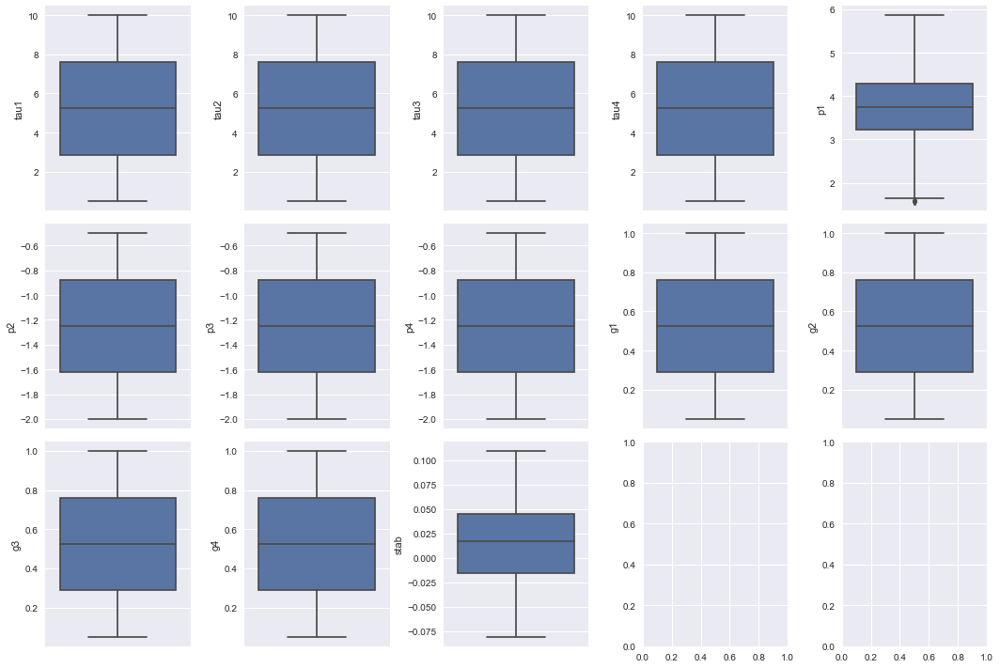

In [55]:
fig, axes = plt.subplots(3, 5, figsize=(15, 10))

for i, col in enumerate(combined.columns):
    sns.boxplot(y=col, data=combined, ax=axes[i // 5, i % 5], orient='v')
plt.tight_layout()

**Observations:**
- The data has no outlier

## EDA

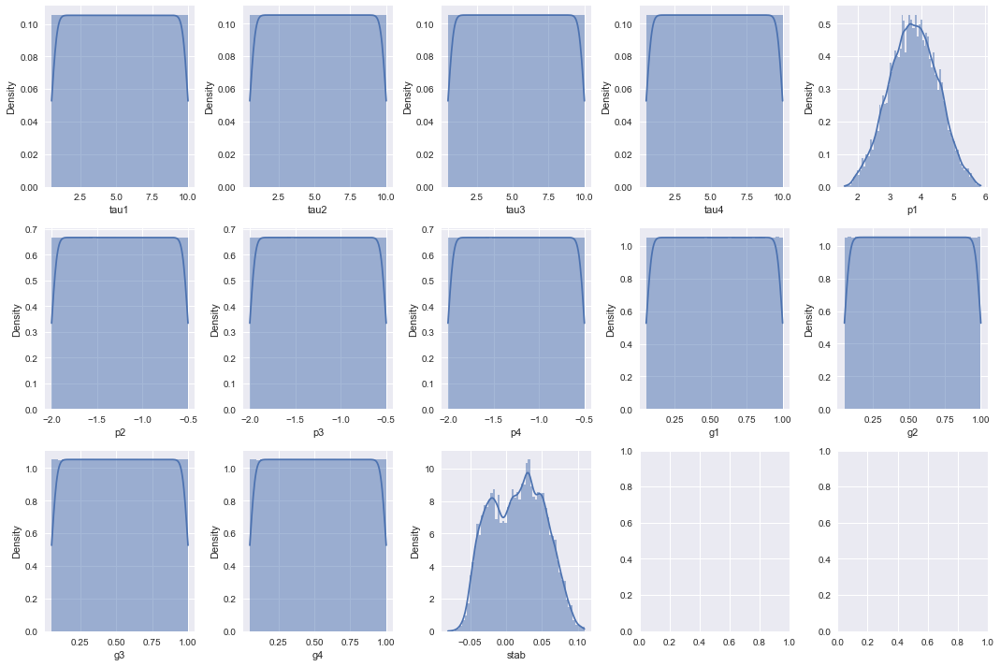

In [56]:
fig, axes = plt.subplots(3, 5, figsize=(15, 10))

for i, col in enumerate(combined.columns):
    sns.histplot(combined[col], ax=axes[i // 5, i % 5], kde=True, stat='density', linewidth=0)
plt.tight_layout()

**Observations:**
- The data is already well distributed

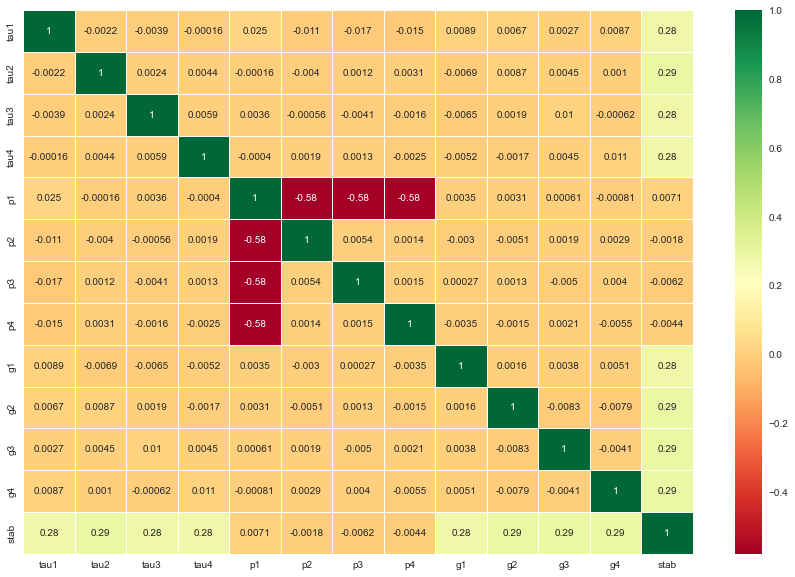

In [57]:
plt.figure(figsize=(15, 10))
sns.heatmap(train_df.corr(), annot=True, cmap='RdYlGn', linewidths=0.5)
plt.show()

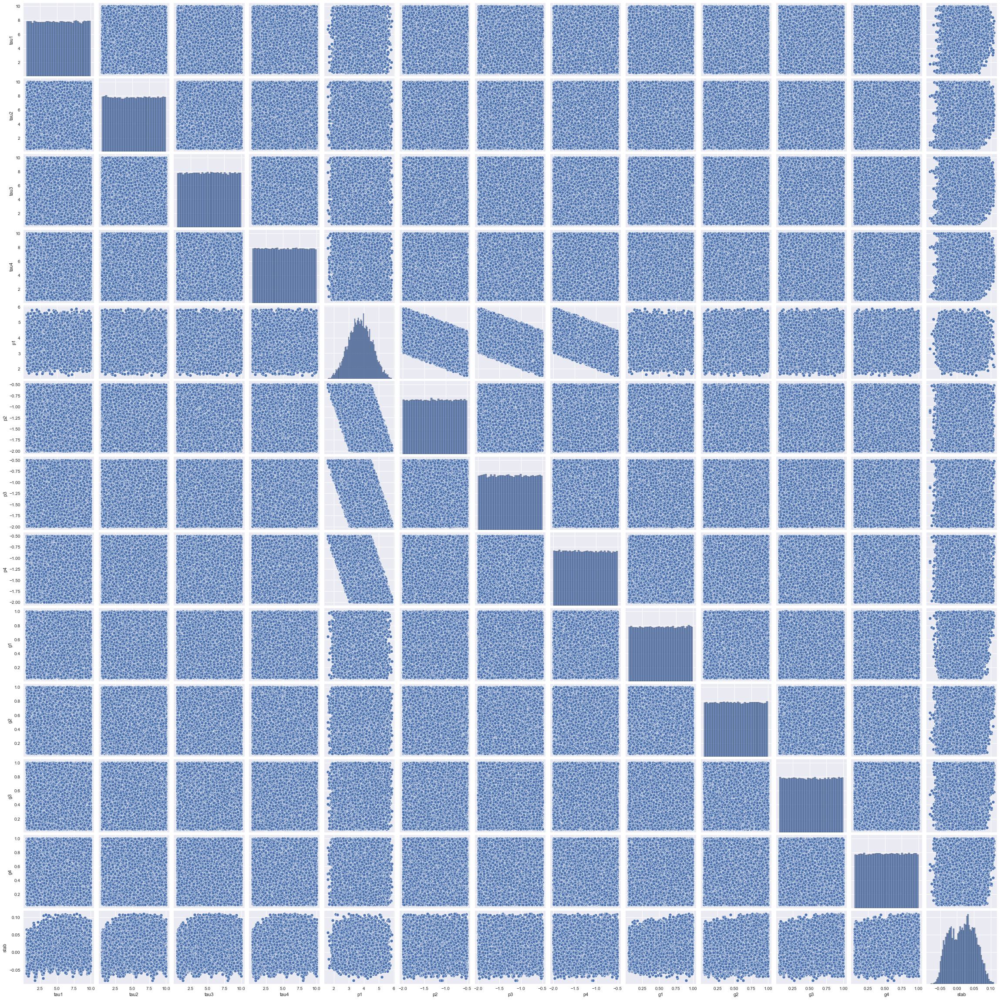

In [58]:
sns.pairplot(train_df, palette='husl')
plt.show()

## Data Preprocessing

In [6]:
combined['g_total'] = abs(combined.g1 + combined.g2 + combined.g3 + combined.g4)
combined.g_total

0        1.271136
1        1.774243
2        3.234857
3        1.789912
4        2.660816
           ...   
11995    2.125730
11996    2.944800
11997    2.253599
11998    2.980268
11999    2.225226
Name: g_total, Length: 60000, dtype: float64

In [7]:
combined['tau_total'] = abs(combined.tau1 + combined.tau2 + combined.tau3 + combined.tau4)
combined.tau_total

0        27.638919
1        20.942879
2        24.163185
3        18.565281
4        11.706791
           ...    
11995    27.734311
11996    14.221986
11997    22.241589
11998    16.236876
11999    27.639858
Name: tau_total, Length: 60000, dtype: float64

In [61]:
combined.drop(['p2', 'p3', 'p4', 'g1', 'g2', 'g3', 'g4', 'tau1', 'tau2', 'tau3', 'tau4'], axis=1, inplace=True)
combined.head()

,p1,stab,g_total,tau_total
0,3.882225,0.014721,1.271136,27.638919
1,3.661015,0.001280,1.774243,20.942879
2,3.103797,0.081829,3.234857,24.163185
3,2.349806,0.030169,1.789912,18.565281
4,4.765681,-0.015164,2.660816,11.706791


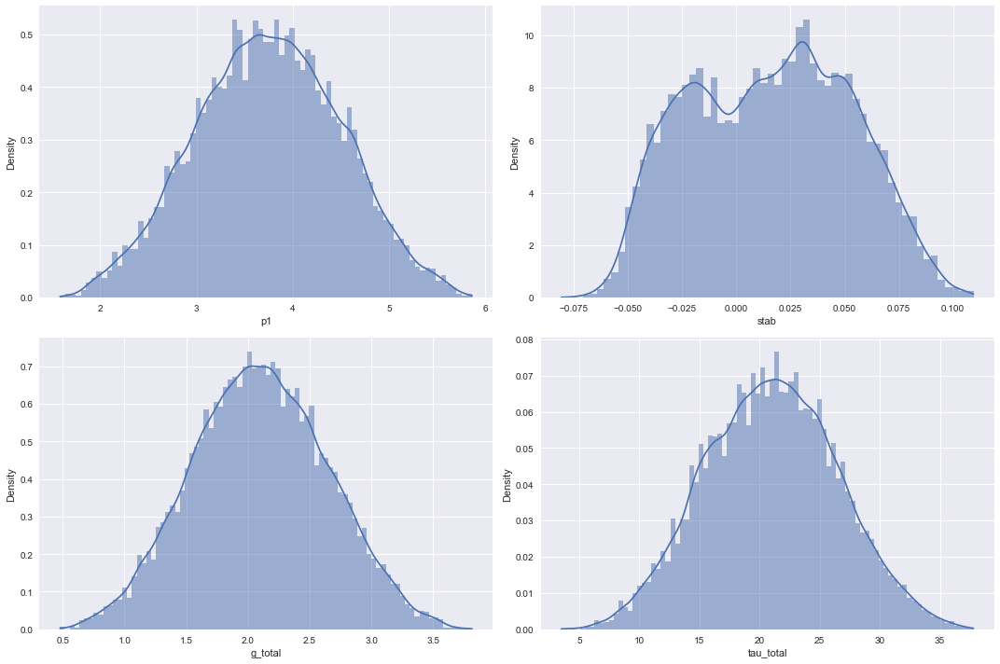

In [62]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for i, col in enumerate(combined.columns):
    sns.histplot(combined[col], ax=axes[i // 2, i % 2], kde=True, stat='density', linewidth=0)
plt.tight_layout()

In [8]:
from sklearn.preprocessing import StandardScaler

In [9]:
ss = StandardScaler()

In [10]:
features = combined.drop(["stab"], axis=1).columns.to_list()
features

['tau1',
 'tau2',
 'tau3',
 'tau4',
 'p1',
 'p2',
 'p3',
 'p4',
 'g1',
 'g2',
 'g3',
 'g4',
 'g_total',
 'tau_total']

In [11]:
scaled_cobined = pd.DataFrame(ss.fit_transform(combined[features]), columns=features, index=combined.index)
scaled_cobined.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,g_total,tau_total
0,0.205311,1.117891,0.967089,0.130540,0.175802,0.070930,-1.082217,0.705928,-1.555860,0.915504,-1.551901,-0.830133,-1.513720,1.207697
1,-1.547949,1.719092,-0.635400,0.443426,-0.118312,0.679713,-1.338089,0.863878,-1.370334,0.748020,0.632531,-1.198063,-0.594917,-0.010391
2,0.177572,1.551669,0.182153,-0.757962,-0.859173,1.475685,1.424376,-1.407721,1.111523,1.081564,1.484059,0.461022,2.072540,0.575420
3,-0.176474,-0.545333,-0.278224,0.112229,-1.861656,0.565369,1.674782,0.993453,1.453354,-0.803992,-1.519224,-0.260855,-0.566301,-0.442904
4,-0.414107,-1.509074,-1.719231,0.253715,1.350420,0.614564,-1.563974,-1.396202,1.613801,-0.051772,0.530937,-0.048000,1.024193,-1.690544


In [12]:
scaled_cobined = pd.concat([scaled_cobined, combined['stab']], axis=1)
scaled_cobined.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,g_total,tau_total,stab
0,0.205311,1.117891,0.967089,0.130540,0.175802,0.070930,-1.082217,0.705928,-1.555860,0.915504,-1.551901,-0.830133,-1.513720,1.207697,0.014721
1,-1.547949,1.719092,-0.635400,0.443426,-0.118312,0.679713,-1.338089,0.863878,-1.370334,0.748020,0.632531,-1.198063,-0.594917,-0.010391,0.001280
2,0.177572,1.551669,0.182153,-0.757962,-0.859173,1.475685,1.424376,-1.407721,1.111523,1.081564,1.484059,0.461022,2.072540,0.575420,0.081829
3,-0.176474,-0.545333,-0.278224,0.112229,-1.861656,0.565369,1.674782,0.993453,1.453354,-0.803992,-1.519224,-0.260855,-0.566301,-0.442904,0.030169
4,-0.414107,-1.509074,-1.719231,0.253715,1.350420,0.614564,-1.563974,-1.396202,1.613801,-0.051772,0.530937,-0.048000,1.024193,-1.690544,-0.015164


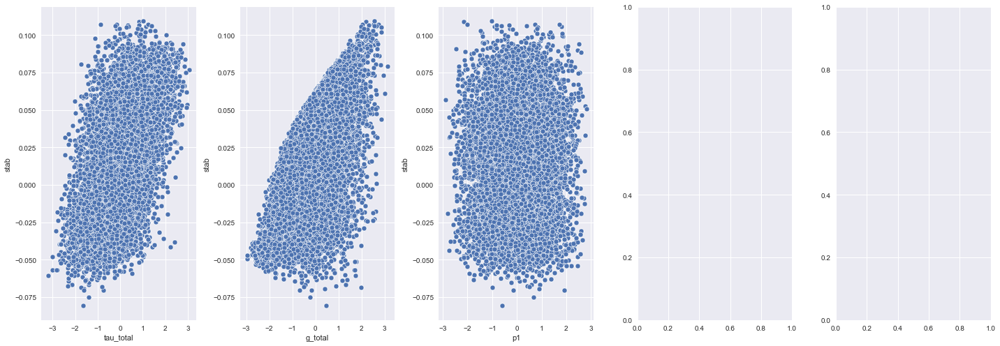

In [68]:
fig, ax = plt.subplots(1, 3, figsize=(20, 7))

for i, col in enumerate(set(scaled_cobined.columns)-{'stab'}):
    sns.scatterplot(x=col, y='stab', data=scaled_cobined, ax=ax[i])
plt.tight_layout()

In [69]:
scaled_cobined.drop('p1', axis=1, inplace=True)

## Split Data

In [13]:
from sklearn.model_selection import train_test_split

In [14]:
train_df = scaled_cobined[:train_df.shape[0]]
test_df = scaled_cobined[train_df.shape[0]:].drop('stab', axis=1)

print(f"Train shape: {train_df.shape}\nTest shape: {test_df.shape}")

Train shape: (48000, 15)
Test shape: (12000, 14)


In [15]:
X = train_df.drop(['stab'], axis=1)
y = train_df.stab

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Train Model

In [17]:
from sklearn.svm import SVR
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.feature_selection import RFECV

In [18]:
svm = SVR(kernel='linear')

In [19]:
selector = RFECV(estimator=svm, step=1, cv=5)

In [20]:
selector.fit(X_train, y_train)

RFECV(cv=5, estimator=SVR(kernel='linear'))

In [22]:
print("Optimal number of features : %d" % selector.n_features_)

Optimal number of features : 1


c:\Users\edutjie\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:103: FutureWarning: The `grid_scores_` attribute is deprecated in version 1.0 in favor of `cv_results_` and will be removed in version 1.2.
  warnings.warn(msg, category=FutureWarning)


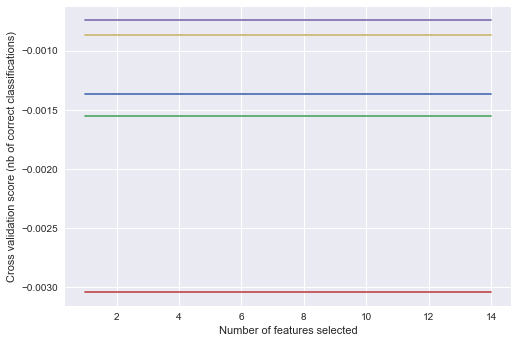

In [24]:
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.show()

In [26]:
FEATURES = list(X_train.columns[selector.support_])
print('Best features :', FEATURES)

Best features : ['tau_total']


In [115]:
# gsc = GridSearchCV(
#     selector,
#     param_grid={
#         "estimator__C": [0.1, 1, 100, 1000],
#         "estimator__epsilon": [0.0001, 0.0005],
#         "estimator__gamma": [0.0001, 0.001],
#     },
#     cv=5,
#     scoring="neg_mean_squared_error",
#     verbose=0,
#     n_jobs=-1,
# )
# grid_result = gsc.fit(X_train, y_train)

In [27]:
svm.fit(X_train[FEATURES], y_train)

SVR(kernel='linear')

## Evaluate Model

In [29]:
svm.score(X_test[FEATURES], y_test)

-0.0016574847405061988

In [31]:
from sklearn.metrics import mean_squared_error

In [32]:
print(f"MSE: {mean_squared_error(y_test, svm.predict(X_test[FEATURES]))}")

MSE: 0.0013732861618786967


In [33]:
print(f"RMSE: {np.sqrt(mean_squared_error(y_test, svm.predict(X_test[FEATURES])))}")

RMSE: 0.03705787584142805


## Submission

In [81]:
test_df.head()

,g_total,tau_total
0,-0.657301,0.663180
1,-1.991691,-0.996018
2,0.929349,0.230325
3,-1.534742,2.352930
4,-0.626616,-0.047007


In [82]:
pred = svm.predict(test_df)
pred

array([0.01432166, 0.01432166, 0.01432166, ..., 0.01432166, 0.01432166,
       0.01432166])

In [83]:
submission = pd.DataFrame({'stab': pred})
submission.head()

,stab
0,0.014322
1,0.014322
2,0.014322
3,0.014322
4,0.014322


In [84]:
submission.to_csv('submission/submission_1.csv', index=False)